# **Exploratory Data Analysis**





**By:**


* Goutham
* Kaviya
* Shivani



## **Overview** 

Attrition, refers to the phenomenon of the employees leaving the company. Employee attrition is always the focus of Human Resource Management. This project aims to predict factors affecting employee attrition.

Dataset :https://raw.githubusercontent.com/GouthamKumar-R/ML/master/D20%20-%20IML/Assignments/EDA%20%2B%20DV/attrition.csv




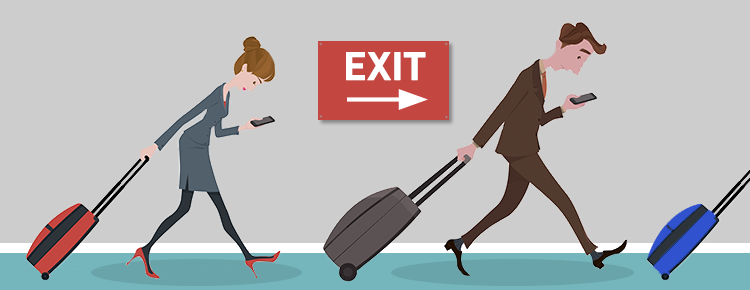


Data Dictonary: https://github.com/GouthamKumar-R/ML/blob/master/D20%20-%20IML/Assignments/EDA%20%2B%20DV/Data%20dict%20%20-%20Attrition.xlsx

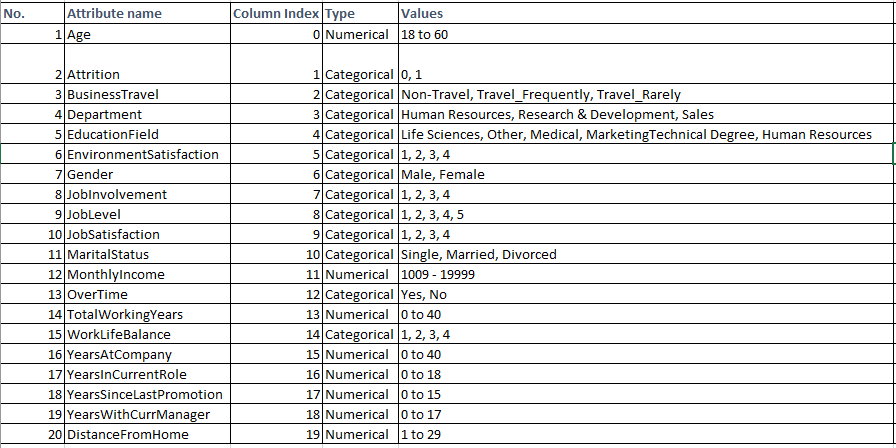

**The plan**<br/>
Exploratory data analysis consists of the following major tasks, which we present linearly here,You may want to do all the steps for a subset of the variables first or you might jump back because you learned something and need to have another look.

1. Form hypotheses/develop investigation themes to explore
2. Wrangle data
3. Assess quality of data
4. Explore each individual variable in the dataset -> **Univariate Analysis**
5. Assess the relationship between each variable and the target - > **Bivariate Analysis**
6. Assess interactions between variables -> **Multivariate Analysis**



**Hypothesis**:
 
1. How monthly income of an employee impacts attrition? Is low income a factor influencing attrition ?
2. Do younger people attrite more for better job opportunities? If yes, what is the age group of those who face attrition?
3. Does distance from home take away the interest of an employee to continue working for the firm?
4. If an employee works beyond the normal working hours, does he leave the company than his/her counterpart that doesn't work overtime?
5. Is work experience of an employee playing a role in attrition?
6. Does marital status and gender really impact attrition? For eg:- Married females. 
7. If an employee is less satisfied by their job , are they attriting more than their counterparts?
8. A person with lower worklife balance and constantly working overtime attriting more than their single or divorced counterparts?
9. Unable to move up the corporate ladder(promotion) really impacting attrition?
10. Toxic work environment(Environmental Satifaction), years with current manager added with low promotion ultimately leading to attrition?
11. Does company's work environment lead to more attrition?
12. Are Low Jobinvolvement and not being satisfied at job leading to attrition?



 ### Libraries


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as ss
import matplotlib.pyplot as plt
#for high resoultion graphs
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg')  
#for ignoring warnings
import warnings           
warnings.filterwarnings("ignore")    

Importing Files to Colab

In [3]:
#importing the file to google folder
from google.colab import files 
  
  
uploaded = files.upload()

Saving attrition.csv to attrition.csv


In [4]:
#reading the file
import io
df = pd.read_csv(io.BytesIO(uploaded['attrition.csv']))

## Data Quality Check

In [5]:
#random sample of 5 records
df.sample(5)

,Age,Attrition,BusinessTravel,Department,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,TotalWorkingYears,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,DistanceFromHome
466,41,0,Travel_Rarely,Sales,Life Sciences,2,Female,3,4,1,Married,16595,No,22,3,18,16,11,8,2
1245,24,0,Travel_Frequently,Human Resources,Medical,1,Male,3,1,4,Married,2145,No,3,3,2,2,2,1,10
537,27,0,Travel_Frequently,Research & Development,Life Sciences,4,Male,3,3,1,Divorced,8793,No,9,2,9,7,1,7,10
1131,34,0,Travel_Frequently,Research & Development,Technical Degree,4,Male,2,2,3,Married,5063,No,8,2,8,2,7,7,10
1173,36,0,Travel_Rarely,Research & Development,Life Sciences,2,Female,3,3,1,Married,8008,No,9,3,3,2,0,2,5


In [6]:
#statistical summary of numerical features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.0,36.0,43.0,60.0
Attrition,1470.0,0.161224,0.367863,0.0,0.0,0.0,0.0,1.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.0,3.0,4.0,4.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.0,3.0,3.0,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.0,2.0,3.0,5.0
JobSatisfaction,1470.0,2.728571,1.102846,1.0,2.0,3.0,4.0,4.0
MonthlyIncome,1470.0,6502.931293,4707.956783,1009.0,2911.0,4919.0,8379.0,19999.0
TotalWorkingYears,1470.0,11.279592,7.780782,0.0,6.0,10.0,15.0,40.0
WorkLifeBalance,1470.0,2.761224,0.706476,1.0,2.0,3.0,3.0,4.0
YearsAtCompany,1470.0,7.008163,6.126525,0.0,3.0,5.0,9.0,40.0


In [7]:
#dimensionality of data
df.shape 

(1470, 20)

In [8]:
#Concise summary of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Age                      1470 non-null   int64 
 1   Attrition                1470 non-null   int64 
 2   BusinessTravel           1470 non-null   object
 3   Department               1470 non-null   object
 4   EducationField           1470 non-null   object
 5   EnvironmentSatisfaction  1470 non-null   int64 
 6   Gender                   1470 non-null   object
 7   JobInvolvement           1470 non-null   int64 
 8   JobLevel                 1470 non-null   int64 
 9   JobSatisfaction          1470 non-null   int64 
 10  MaritalStatus            1470 non-null   object
 11  MonthlyIncome            1470 non-null   int64 
 12  OverTime                 1470 non-null   object
 13  TotalWorkingYears        1470 non-null   int64 
 14  WorkLifeBalance          1470 non-null  

From the above result, we can infer that there are no NULL values and missing values

In [9]:
#storing all feature_names to a list
allcolumns = df.columns.tolist()
allcolumns

['Age',
 'Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'EnvironmentSatisfaction',
 'Gender',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'OverTime',
 'TotalWorkingYears',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'DistanceFromHome']

Splitting **Categorical** and **Numerical** features

In [10]:
#wrangling - binning the age group-> for understanding the underlying pattern
df["ageGroup"] = pd.cut(df.Age,[18,25,34,41,48,55,60], labels = ['18-25','25-34','34-41','41-48','48-55','55-60'])

In [11]:
#splitting the Categorical features along with target
df_cat = df[['Attrition','ageGroup', 'BusinessTravel', 'Department', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MaritalStatus', 'OverTime',
        'WorkLifeBalance']]
df_cat.sample(5)

,Attrition,ageGroup,BusinessTravel,Department,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,MaritalStatus,OverTime,WorkLifeBalance
733,0,25-34,Travel_Rarely,Research & Development,Medical,4,Male,4,2,4,Married,No,3
1259,0,25-34,Travel_Rarely,Research & Development,Life Sciences,3,Male,4,2,3,Married,No,3
823,0,25-34,Travel_Frequently,Research & Development,Life Sciences,4,Female,3,1,2,Divorced,No,2
945,0,48-55,Travel_Rarely,Research & Development,Life Sciences,4,Female,3,4,1,Married,Yes,3
351,0,25-34,Travel_Rarely,Research & Development,Medical,3,Female,3,1,2,Married,No,3


In [12]:
# df_cat = df_cat.drop(['Attrition'], axis =1)

In [13]:
#splitting the Numerical Features along with target
df_num = df[['Attrition','MonthlyIncome','TotalWorkingYears', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'DistanceFromHome' ]]
df_num.sample(5)

,Attrition,MonthlyIncome,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,DistanceFromHome
462,0,5337,10,10,7,5,7,21
625,0,10761,18,5,4,0,2,9
656,1,2795,1,1,0,0,1,25
1251,0,7140,12,7,7,1,7,15
171,1,2325,1,0,0,0,0,1


In [14]:
# df_num = df_num.drop(['Attrition'], axis =1)

## **Univaritate Analysis:**
Exploring each individual Variable/Features

Basics to do<br/>
Quantify:

* Location: mean, median, mode, interquartile mean<br/>
* Spread: standard deviation, variance, range, interquartile range<br/>
* Shape: skewness, kurtosis

#### **Target variable**

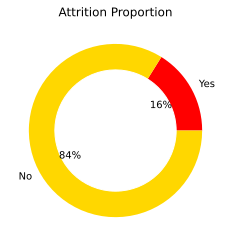

In [15]:
#Attrition proportion - Using Doughnut chart
Y_count = len(df[df['Attrition'] == 1])
N_count = len(df[df['Attrition'] == 0])
# create data
names='Yes', 'No',
size=[Y_count,N_count]
 
# Create a circle for the center of the plot
circle = plt.Circle( (0,0), 0.7, color='white')   
plt.pie(size, labels=names, colors=['Red','Gold'],autopct='%1.0f%%')  
p=plt.gcf()
p.gca().add_artist(circle)
ax = plt.axes()
ax.set_title("Attrition Proportion")
plt.show() 

 *Insight: It is an Imbalanced dataset.*

---



---



#### **Categorical Features:**

Analysis for Categorical variables: count, count distinct, Unique values

Graphs for Attrition:
Total_no. of categories:2




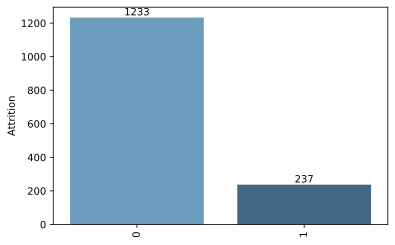

Graphs for ageGroup:
Total_no. of categories:6




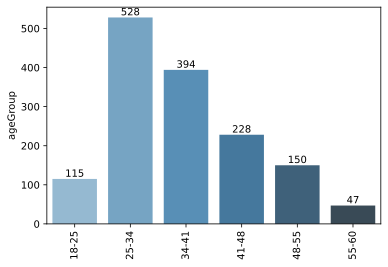

Graphs for BusinessTravel:
Total_no. of categories:3




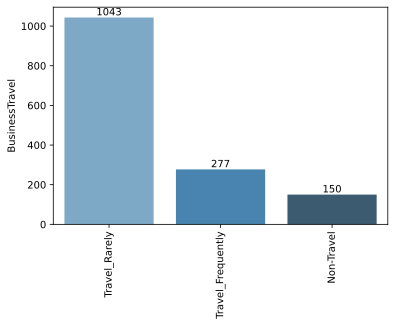

Graphs for Department:
Total_no. of categories:3




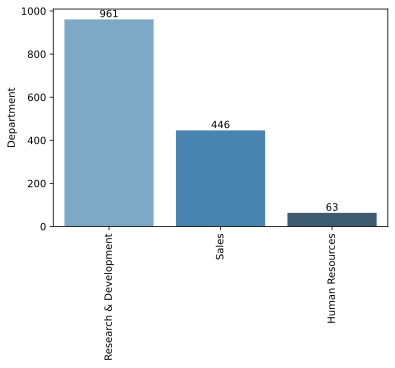

Graphs for EducationField:
Total_no. of categories:6




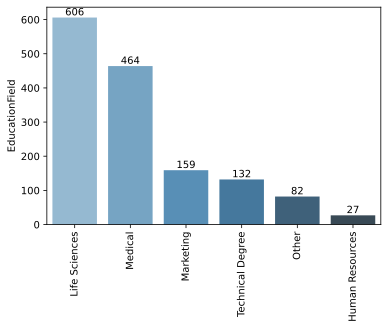

Graphs for EnvironmentSatisfaction:
Total_no. of categories:4




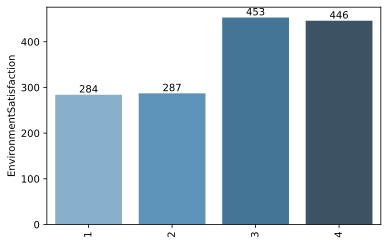

Graphs for Gender:
Total_no. of categories:2




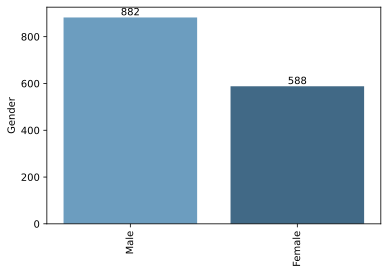

Graphs for JobInvolvement:
Total_no. of categories:4




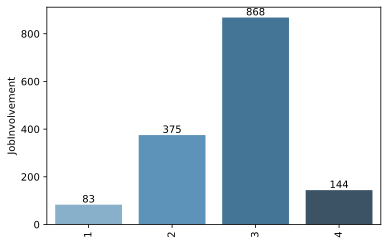

Graphs for JobLevel:
Total_no. of categories:5




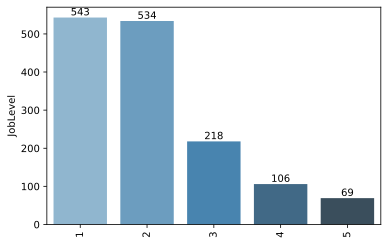

Graphs for JobSatisfaction:
Total_no. of categories:4




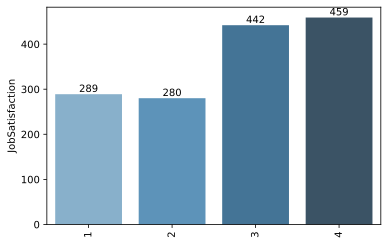

Graphs for MaritalStatus:
Total_no. of categories:3




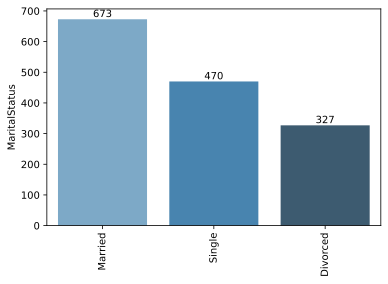

Graphs for OverTime:
Total_no. of categories:2




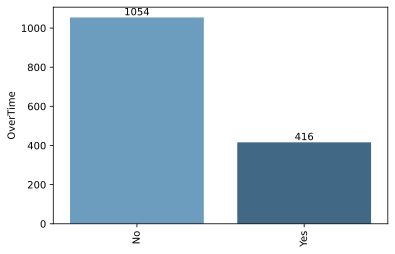

Graphs for WorkLifeBalance:
Total_no. of categories:4




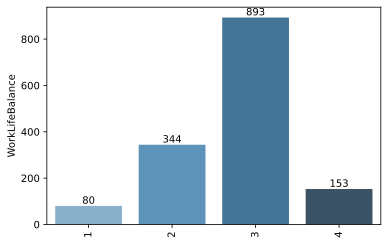

In [16]:
#barplot: One axis is the category axis indicating the category, 
#           while the second axis is the value axis that shows the numeric value of that category, indicated by the length of the bar.

for i in df_cat:   
    cat_num = df_cat[i].value_counts()
    print("Graphs for %s:\nTotal_no. of categories:%d\n\n" %(i, len(cat_num)))
    chart = sns.barplot(x= cat_num.index, y= cat_num, palette="Blues_d")
    chart.set_xticklabels(chart.get_xticklabels(),rotation = 90)   #rotating labels for better readability
    for bar in chart.patches:  #adding annotation to the graphs
      chart.annotate(format(bar.get_height(), '.0f'), 
      (bar.get_x() + bar.get_width() / 2., bar.get_height()), 
       ha = 'center', va = 'center', 
       xytext = (0, 5), 
       textcoords = 'offset points')
    plt.show()

*Insights:* 

1. More people fall under the age-group 25-40
1. More people are working in R&D   
2. Most of the people are from Life sciences and Medicacl background, This means this company can be a Pharmacetuiacal company.
3.  Most of them are freshers(with joblevel 1 or 2)
4. Almost 30% work in OT
5. Most of the People have rated their Work-life balance as 3, why not 4?



---



---



#### **Numerical Features:**

Analysis for Numerical Features : count, min, max

Graphs for Attrition:
Minmum value of Attrition is :0
Maximum value of Attritionis:1




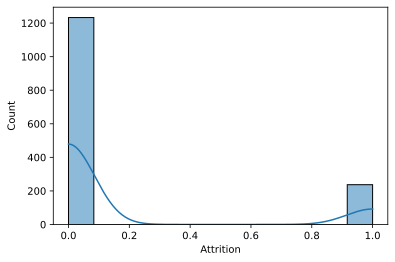

Graphs for MonthlyIncome:
Minmum value of MonthlyIncome is :1009
Maximum value of MonthlyIncomeis:19999




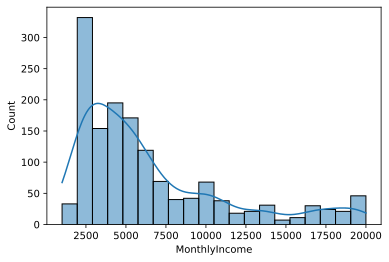

Graphs for TotalWorkingYears:
Minmum value of TotalWorkingYears is :0
Maximum value of TotalWorkingYearsis:40




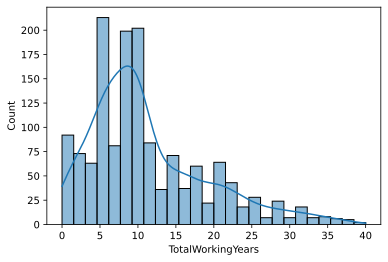

Graphs for YearsAtCompany:
Minmum value of YearsAtCompany is :0
Maximum value of YearsAtCompanyis:40




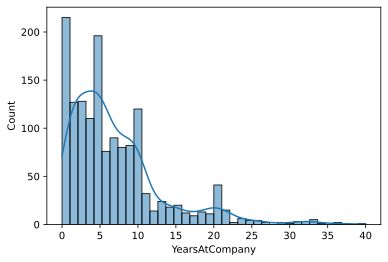

Graphs for YearsInCurrentRole:
Minmum value of YearsInCurrentRole is :0
Maximum value of YearsInCurrentRoleis:18




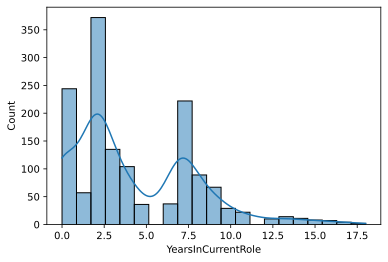

Graphs for YearsSinceLastPromotion:
Minmum value of YearsSinceLastPromotion is :0
Maximum value of YearsSinceLastPromotionis:15




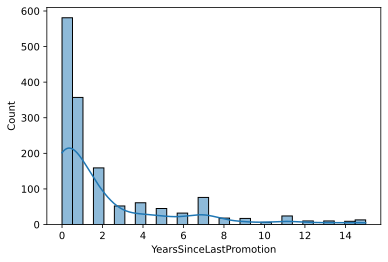

Graphs for YearsWithCurrManager:
Minmum value of YearsWithCurrManager is :0
Maximum value of YearsWithCurrManageris:17




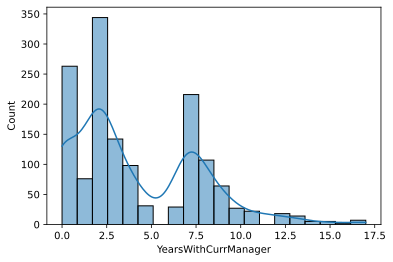

Graphs for DistanceFromHome:
Minmum value of DistanceFromHome is :1
Maximum value of DistanceFromHomeis:29




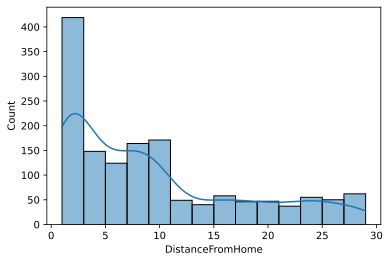

In [17]:
#histogram with kde for analysing teh distribution of the data
for i in df_num:
  min = df_num[i].min()
  max = df_num[i].max()
  print("Graphs for %s:\nMinmum value of %s is :%d\nMaximum value of %sis:%d\n\n" %(i,i,min,i,max))
  sns.histplot(df_num, x=i, kde=True)
  plt.show()

*Insights:*

1. **Monthly Income** is Right skewed : Low income people are high in no.(less than 10,000)
2. **Total Working years** is Right Skewed : People with less than 10 yrs of work exp. are high in no.
3. **Years at Company** It is clear that there are a lot of freshers with 0 years at the company.


---



---




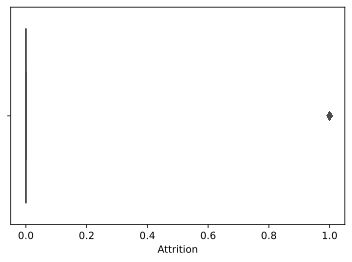

Median value of Attrition is :0
Q1 value of Attrition is :0
Q3 value of Attrition is :0
IQR value of Attrition is :0




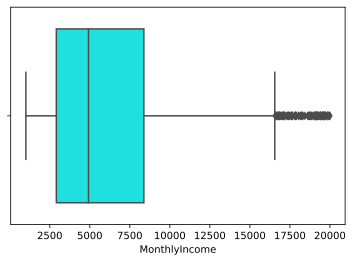

Median value of MonthlyIncome is :4919
Q1 value of MonthlyIncome is :2911
Q3 value of MonthlyIncome is :8379
IQR value of MonthlyIncome is :5468




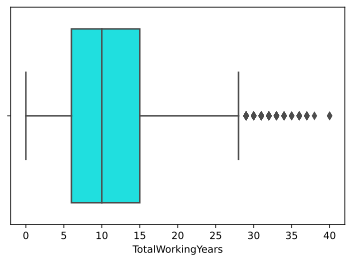

Median value of TotalWorkingYears is :10
Q1 value of TotalWorkingYears is :6
Q3 value of TotalWorkingYears is :15
IQR value of TotalWorkingYears is :9




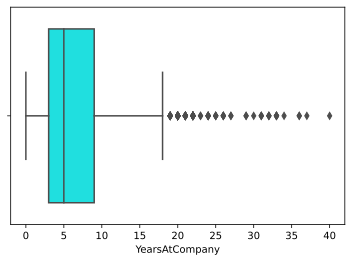

Median value of YearsAtCompany is :5
Q1 value of YearsAtCompany is :3
Q3 value of YearsAtCompany is :9
IQR value of YearsAtCompany is :6




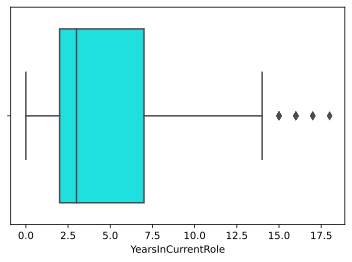

Median value of YearsInCurrentRole is :3
Q1 value of YearsInCurrentRole is :2
Q3 value of YearsInCurrentRole is :7
IQR value of YearsInCurrentRole is :5




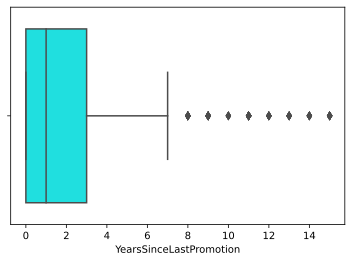

Median value of YearsSinceLastPromotion is :1
Q1 value of YearsSinceLastPromotion is :0
Q3 value of YearsSinceLastPromotion is :3
IQR value of YearsSinceLastPromotion is :3




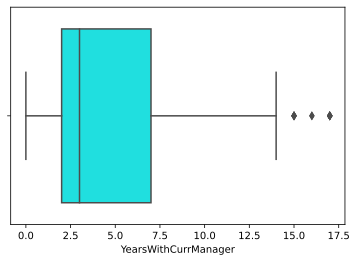

Median value of YearsWithCurrManager is :3
Q1 value of YearsWithCurrManager is :2
Q3 value of YearsWithCurrManager is :7
IQR value of YearsWithCurrManager is :5




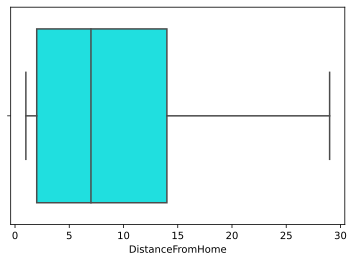

Median value of DistanceFromHome is :7
Q1 value of DistanceFromHome is :2
Q3 value of DistanceFromHome is :14
IQR value of DistanceFromHome is :12




In [18]:
#boxplots for outliers analysis
for i in df_num:
    sns.boxplot(x = df_num[i], color='cyan')
    plt.show()
    med = df_num[i].median()
    Q1 = df_num[i].quantile(0.25)
    Q3 = df_num[i].quantile(0.75)
    IQR = df_num[i].quantile(0.75) - df_num[i].quantile(0.25)
    print("Median value of %s is :%d" %(i,med))
    print("Q1 value of %s is :%d\nQ3 value of %s is :%d\nIQR value of %s is :%d\n\n"%(i,Q1,i,Q3,i,IQR))


*Insights:*


* **Monhtly Income** , Median salary is 4919, 75% of the people get a salary below 8379-> which implies that a lot of people are in range between 2.5K to 8.3K + There are lot of outliers (people in higher management)

  



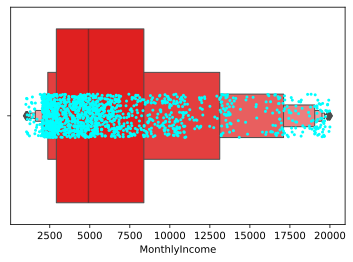

In [19]:
#additional graph: for visual verification of Monthly income distribution
#boxen + stripplot for distribution analysis

sns.boxenplot(x = df_num['MonthlyIncome'], color="red")
sns.stripplot(x = df_num['MonthlyIncome'], color = 'cyan', size = 3)
plt.show()

*Insights:*<br/>
It is evident from the boxen + stripplot that, more datapoints are between 2.5K to 7.5K in monthly income-> Low income people are high in no.

---



---




## **Bivariate Analysis:**
How does each field interact with the target?

#### Correlation and Heatmap : Numerical vs Cat(Attrition)

In [20]:
#correlation matrix - numerical data
correlation_matrix = df_num.corr()
correlation_matrix.to_csv("Correlation_mat-Attrition.csv")
correlation_matrix

,Attrition,MonthlyIncome,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,DistanceFromHome
Attrition,1.000000,-0.159840,-0.171063,-0.134392,-0.160545,-0.033019,-0.156199,0.077924
MonthlyIncome,-0.159840,1.000000,0.772893,0.514285,0.363818,0.344978,0.344079,-0.017014
TotalWorkingYears,-0.171063,0.772893,1.000000,0.628133,0.460365,0.404858,0.459188,0.004628
YearsAtCompany,-0.134392,0.514285,0.628133,1.000000,0.758754,0.618409,0.769212,0.009508
YearsInCurrentRole,-0.160545,0.363818,0.460365,0.758754,1.000000,0.548056,0.714365,0.018845
YearsSinceLastPromotion,-0.033019,0.344978,0.404858,0.618409,0.548056,1.000000,0.510224,0.010029
YearsWithCurrManager,-0.156199,0.344079,0.459188,0.769212,0.714365,0.510224,1.000000,0.014406
DistanceFromHome,0.077924,-0.017014,0.004628,0.009508,0.018845,0.010029,0.014406,1.000000


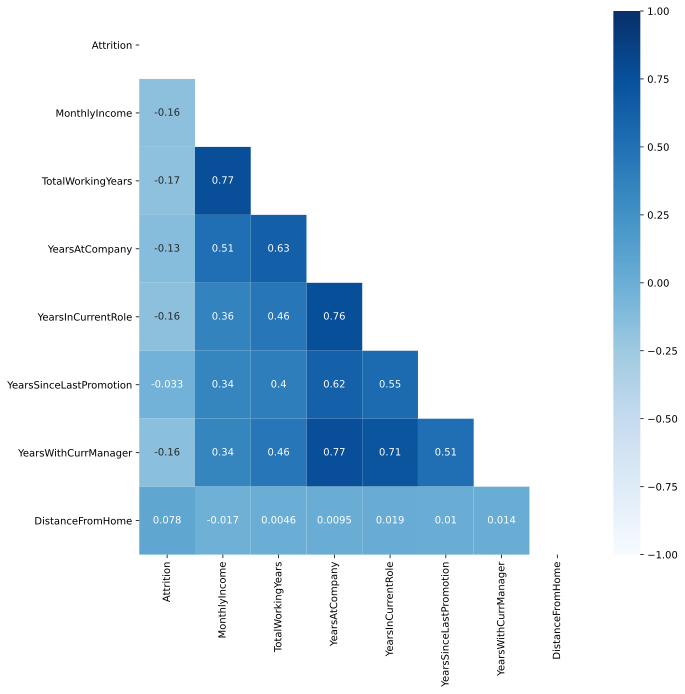

In [21]:
plt.figure(figsize=(10,10))
matrix = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix,annot=True,mask = matrix,cmap="Blues", vmin=-1,vmax=1,center=0)

*Insights:*<br/>
More varaibles are negatively correalted with target!! 



*Insight:*<br/>
**Interstingly!!** Distancce from home, doesn't affect attrition rate.

#### **Categorical Associations:**

In [ ]:
#changing all catg to num(dummy encoding)
df_cat1 = pd.get_dummies(df_cat)
df_cat1.head()

In [23]:
#categorical association -csv
cat_association = df_cat1.corr()
cat_association.to_csv("Categorical_associations-Attrition.csv")
cat_association

,Attrition,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,WorkLifeBalance,ageGroup_18-25,ageGroup_25-34,ageGroup_34-41,ageGroup_41-48,ageGroup_48-55,ageGroup_55-60,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,OverTime_No,OverTime_Yes
Attrition,1.000000,-0.103369,-0.130016,-0.169105,-0.103481,-0.063939,0.147828,0.080485,-0.094064,-0.080532,-0.043901,0.004442,-0.074457,0.115143,-0.049538,0.016832,-0.085293,0.080855,0.036466,-0.032703,0.055781,-0.046999,-0.017898,0.069355,-0.029453,0.029453,-0.087716,-0.090984,0.175419,-0.246118,0.246118
EnvironmentSatisfaction,-0.103369,1.000000,-0.008278,0.001212,-0.006784,0.027627,-0.011600,0.006366,-0.003341,-0.013007,0.015908,0.007349,0.003568,-0.012624,0.008496,-0.007597,0.027976,-0.025606,-0.006898,-0.024526,0.000479,-0.021299,0.064602,0.027713,-0.000508,0.000508,0.016439,-0.022180,0.009035,-0.070132,0.070132
JobInvolvement,-0.130016,-0.008278,1.000000,-0.012630,-0.021476,-0.014617,0.028697,-0.046654,-0.007758,0.046432,0.001612,-0.001668,-0.045779,0.004424,0.026714,0.004789,0.023187,-0.026107,0.002079,0.003228,-0.018657,0.017103,-0.011895,-0.004519,-0.017960,0.017960,0.016815,0.028324,-0.045253,0.003507,-0.003507
JobLevel,-0.169105,0.001212,-0.012630,1.000000,-0.001944,0.037818,-0.227452,-0.282884,0.019161,0.199406,0.339991,0.104813,-0.007295,-0.021557,0.023433,-0.006157,-0.107830,0.114307,0.010409,-0.008431,0.092698,-0.014114,-0.016724,-0.054707,0.039403,-0.039403,0.037087,0.050547,-0.087072,-0.000544,0.000544
JobSatisfaction,-0.103481,-0.006784,-0.021476,-0.001944,1.000000,-0.019459,-0.008699,0.004263,-0.004259,0.008328,-0.006698,-0.007867,0.019802,0.027117,-0.036562,-0.024068,-0.002798,0.013499,-0.021467,0.052004,-0.023528,-0.022645,0.003380,-0.019795,-0.033252,0.033252,-0.015197,-0.010315,0.024571,-0.024539,0.024539
WorkLifeBalance,-0.063939,0.027627,-0.014617,0.037818,-0.019459,1.000000,0.030343,-0.027961,0.008867,0.041086,-0.013313,-0.064484,0.005780,0.010199,-0.012640,0.047763,-0.069922,0.051320,-0.003967,-0.039728,0.018500,0.001641,0.031812,0.021962,0.002753,-0.002753,-0.009080,-0.006388,0.014921,0.027092,-0.027092
ageGroup_18-25,0.147828,-0.011600,0.028697,-0.227452,-0.008699,0.030343,1.000000,-0.218108,-0.176287,-0.124820,-0.098206,-0.052945,-0.022886,-0.043208,0.052480,-0.011614,-0.011609,0.017131,-0.002118,-0.032979,-0.028048,0.009270,0.039572,0.041412,-0.036197,0.036197,-0.064455,-0.038896,0.099030,-0.025059,0.025059
ageGroup_25-34,0.080485,0.006366,-0.046654,-0.282884,0.004263,-0.027961,-0.218108,1.000000,-0.453037,-0.320773,-0.252377,-0.136062,-0.008795,0.056224,-0.042567,-0.011402,-0.024365,0.030239,0.003190,-0.010558,-0.005068,0.004084,-0.015156,0.027714,-0.000579,0.000579,0.018912,-0.039078,0.024881,0.051688,-0.051688
ageGroup_34-41,-0.094064,-0.003341,-0.007758,0.019161,-0.004259,0.008867,-0.176287,-0.453037,1.000000,-0.259268,-0.203986,-0.109974,0.024333,-0.020593,0.001514,0.000867,0.004603,-0.005145,0.031606,0.042357,-0.007993,-0.027641,0.013530,-0.045016,-0.005016,0.005016,0.019776,0.008069,-0.026256,-0.005117,0.005117
ageGroup_41-48,-0.080532,-0.013007,0.046432,0.199406,0.008328,0.041086,-0.124820,-0.320773,-0.259268,1.000000,-0.144433,-0.077867,0.016977,0.000177,-0.011472,0.029956,0.003740,-0.017068,-0.030618,0.000031,0.020201,0.000132,0.018682,-0.022832,0.006905,-0.006905,0.023865,0.024956,-0.047942,-0.014508,0.014508


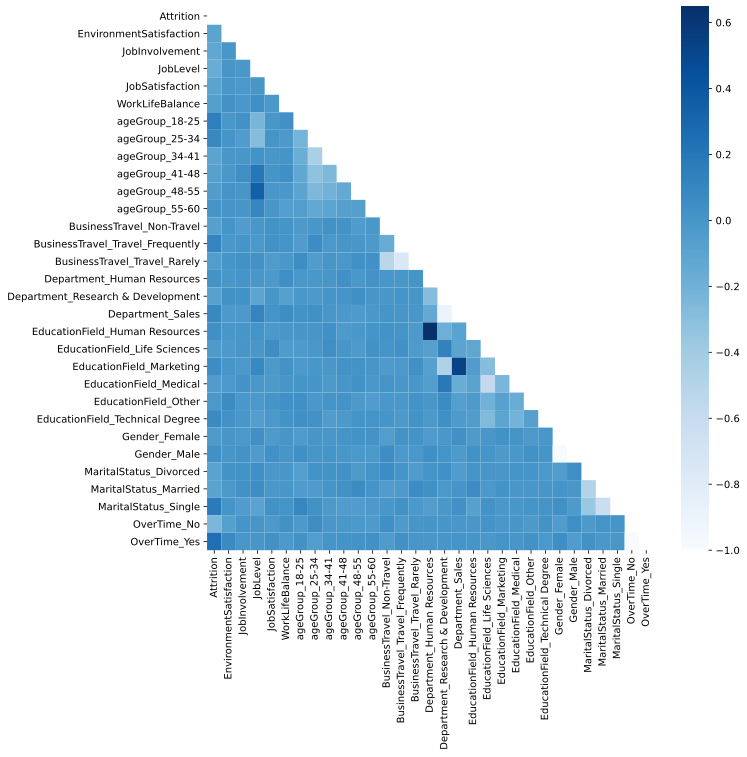

In [24]:
plt.figure(figsize=(10,10))
matrix = np.triu(cat_association)
sns.heatmap(cat_association, cmap="Blues", mask= matrix)
plt.savefig("Categorical_associations-Attrition")

*Insights:*<br/>
High Correlation doesn't mean its causes the attrition. We use correaltion to find Causality.

Correaltion vs Causality:

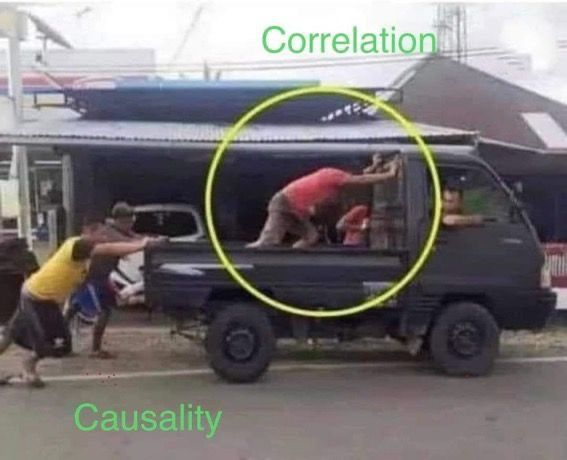

So, let's not conclude with correaltion, let us proceed with further analysis.

#### Contigency table: Cat vs Cat(Attrition)

**OverTime** vs Attrition:<br/>
28% of the employees are doing overtime,

Out of 16% attrited employees how many have worked overtime?

In [29]:
#using croostab to get contigency table(pivot table)
(pd.crosstab(df_cat['Attrition'],df_cat['OverTime'],normalize=True,margins=True, margins_name="Total%")*100).round(1)


OverTime,No,Yes,Total%
Attrition,,,
0,64.2,19.7,83.9
1,7.5,8.6,16.1
Total%,71.7,28.3,100.0


In [28]:
pd.crosstab(df_cat['Attrition'],df_cat['OverTime'],margins=True, margins_name="Total")


OverTime,No,Yes,Total
Attrition,,,
0,944,289,1233
1,110,127,237
Total,1054,416,1470


*Insight:* <br/>
**Interesting!!!** OT have a significat Impact on Attrition rate
 
Out of 416 OT workers -> 127(30% of 416) have attrited, <br/>
whereas Only 110 workers attrited from 1054 Non-OT workers which is just 10%. 

---



---



**Job Level** vs Attrition:

77% of the employees are with Level 1 & 2,

Out of 16% attrited employees how many are with 1 & 2 job level?




In [30]:
(pd.crosstab(df_cat['Attrition'],df_cat['JobLevel'],normalize=True,margins=True, margins_name="Total")*100).round(1)

JobLevel,1,2,3,4,5,Total
Attrition,,,,,,
0,27.2,32.8,12.7,6.9,4.4,83.9
1,9.7,3.5,2.2,0.3,0.3,16.1
Total,36.9,36.3,14.8,7.2,4.7,100.0


In [31]:
pd.crosstab(df_cat['Attrition'],df_cat['JobLevel'],margins=True, margins_name="Total")

JobLevel,1,2,3,4,5,Total
Attrition,,,,,,
0,400,482,186,101,64,1233
1,143,52,32,5,5,237
Total,543,534,218,106,69,1470


*Insights:*<br/>
More people from Joblevel 1 and 2 have attrited.

1. 82% of Attrited people were from job level 1 and 2

---



---






**Job Satisfaction** vs Attrition

In [32]:
(pd.crosstab(df_cat['Attrition'],df_cat['JobSatisfaction'],normalize=True,margins=True, margins_name="Total%")*100).round(1)

JobSatisfaction,1,2,3,4,Total%
Attrition,,,,,
0,15.2,15.9,25.1,27.7,83.9
1,4.5,3.1,5.0,3.5,16.1
Total%,19.7,19.0,30.1,31.2,100.0


*Insight:* <br/>
Almost 20% people have given a rating of 1, out of those 19.7%-> 4.5% have 

1.   Almost 20% people have given a rating of **1**, out of those 19.7%-> 22.8%( have attrited.
2.   Similarly, who gave a rating of **2**, out of those 15% have attrited.


---



---





**Business Travel** Vs Attrition:

In [33]:
(pd.crosstab(df_cat['Attrition'],df_cat['BusinessTravel'],normalize=True,margins=True, margins_name="Total%")*100).round(1)

BusinessTravel,Non-Travel,Travel_Frequently,Travel_Rarely,Total%
Attrition,,,,
0,9.4,14.1,60.3,83.9
1,0.8,4.7,10.6,16.1
Total%,10.2,18.8,71.0,100.0


**Gender** vs Attrition:

In [34]:
(pd.crosstab(df_cat['Attrition'],df_cat['Gender'],normalize=True,margins=True, margins_name="Total%")*100).round(1)

Gender,Female,Male,Total%
Attrition,,,
0,34.1,49.8,83.9
1,5.9,10.2,16.1
Total%,40.0,60.0,100.0


*Insight:*<br/>

Male employees have contributed to 10% of attrition out of 16%

---



---



**Marital Status** vs Attrition:

In [35]:
(pd.crosstab(df_cat['Attrition'],df_cat['MaritalStatus'],normalize=True,margins=True, margins_name="Total%")*100).round(1)

MaritalStatus,Divorced,Married,Single,Total%
Attrition,,,,
0,20.0,40.1,23.8,83.9
1,2.2,5.7,8.2,16.1
Total%,22.2,45.8,32.0,100.0


*Insight:*<br/>
Employees who are single have contributed to 8% of attrition out of 16%.

---



---



**Age Group** vs Attrition:

In [44]:
(pd.crosstab(df_cat['Attrition'],df['ageGroup'],normalize=True,margins=True, margins_name="Total%")*100).round(1)

ageGroup,18-25,25-34,34-41,41-48,48-55,55-60,Total%
Attrition,,,,,,,
0,5.1,28.9,24.1,14.2,9.1,2.7,84.1
1,2.7,7.3,2.8,1.4,1.2,0.5,15.9
Total%,7.9,36.1,26.9,15.6,10.3,3.2,100.0


In [47]:
pd.crosstab(df_cat['Attrition'],df_cat['ageGroup'],margins=True, margins_name="Total")

ageGroup,18-25,25-34,34-41,41-48,48-55,55-60,Total
Attrition,,,,,,,
0,75,422,353,207,133,39,1229
1,40,106,41,21,17,8,233
Total,115,528,394,228,150,47,1462


*Insights:*<br/>
Almost 50% of employees who have attrited are from age group 25-34

# Multiple barplots : Cat vs Cat(Attrition)

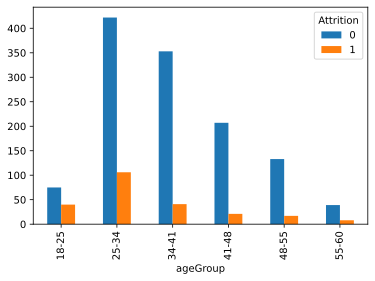

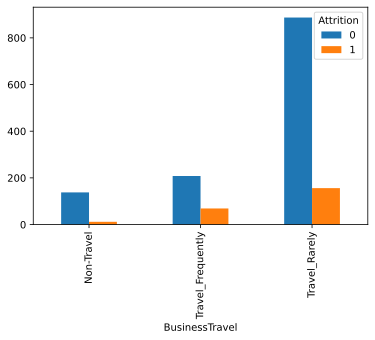

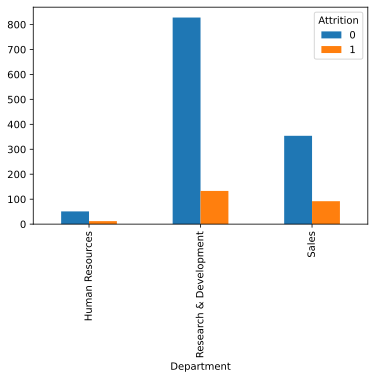

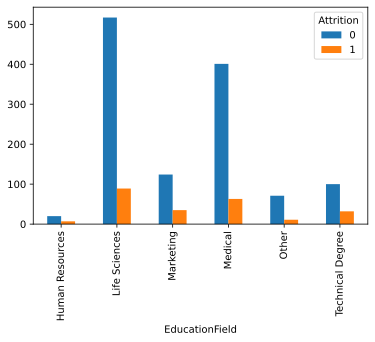

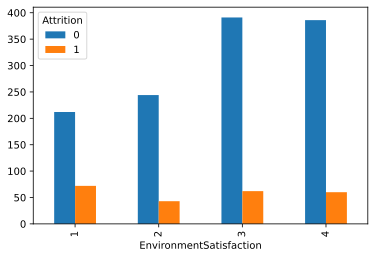

...

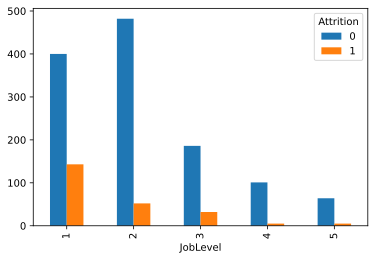

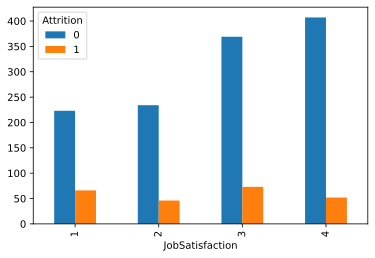

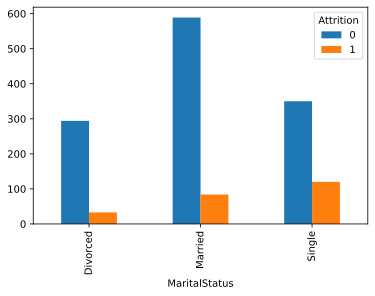

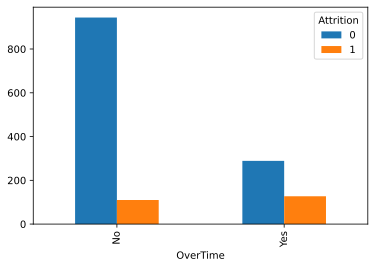

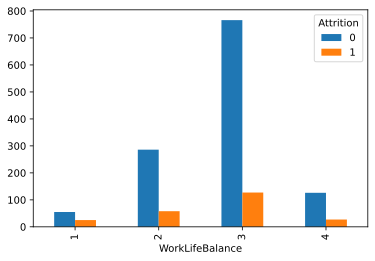

In [36]:
#Multiple bar plots-> to compare the categories in a single feature vs attrition  
x_cat = df_cat.drop(['Attrition'],axis =1)
for i in x_cat:
  pd.crosstab(x_cat[i], df_cat['Attrition']).plot.bar()
  plt.show()
  print("\n\n\n")

*Insights:*




1.   List item
2.   List item


---



---




# Boxplots : Numerical vs Cat(Attrition)

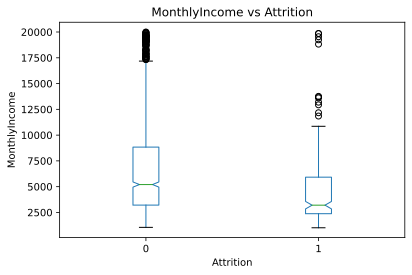

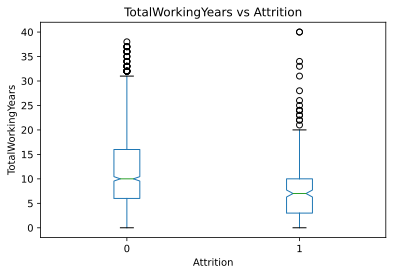

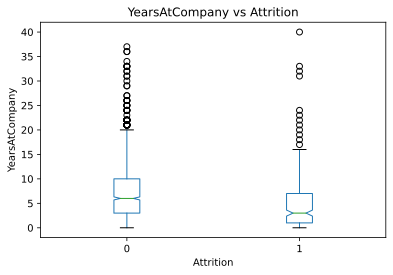

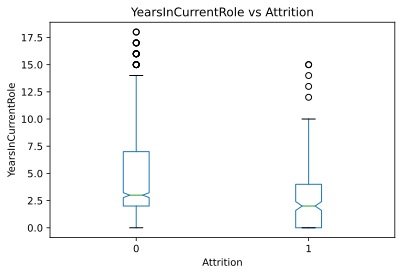

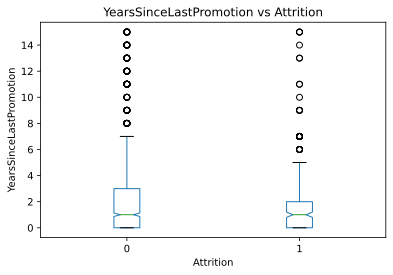

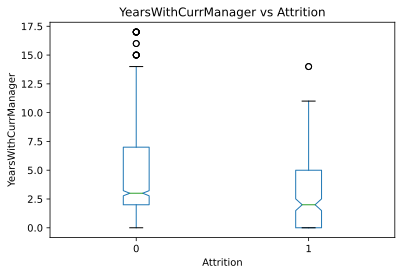

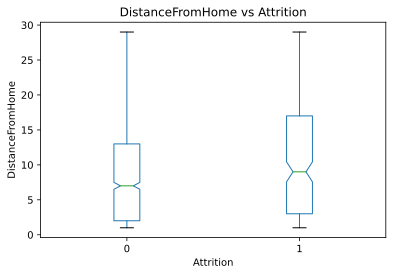

In [37]:
x_num = df_num.drop(['Attrition'], axis=1)

for i in x_num:
  df_num.boxplot(column= i, by="Attrition", notch = True, grid=False, vert = True )
  plt.suptitle('')
  plt.title('%s vs Attrition'%i)
  plt.ylabel("%s"%i)
  plt.show()
  print("\n\n\n")

*Insights:*



In [42]:
#Analysing the attrition pattern of employees, whose distancce from home is greater than 75% of employee
Dist =df[df['DistanceFromHome'] >13]
Dist #People with Distance from home >13 -> Greter than Q3  

,Age,Attrition,BusinessTravel,Department,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,TotalWorkingYears,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,DistanceFromHome,ageGroup
7,30,0,Travel_Rarely,Research & Development,Life Sciences,4,Male,3,1,3,Divorced,2693,No,1,3,1,0,0,0,24,25-34
8,38,0,Travel_Frequently,Research & Development,Life Sciences,4,Male,2,3,3,Single,9526,No,10,3,9,7,1,8,23,34-41
9,36,0,Travel_Rarely,Research & Development,Medical,3,Male,3,2,3,Married,5237,No,17,2,7,7,7,7,27,34-41
10,35,0,Travel_Rarely,Research & Development,Medical,1,Male,4,1,2,Married,2426,No,6,3,5,4,0,3,16,34-41
11,29,0,Travel_Rarely,Research & Development,Life Sciences,4,Female,2,2,3,Single,4193,Yes,10,3,9,5,0,8,15,25-34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,35,0,Travel_Frequently,Research & Development,Life Sciences,3,Male,3,2,3,Married,5689,Yes,10,4,10,2,0,2,18,34-41
1460,29,0,Travel_Rarely,Research & Development,Medical,4,Female,2,1,1,Single,3785,No,5,1,5,4,0,4,28,25-34
1461,50,1,Travel_Rarely,Sales,Marketing,4,Male,2,3,1,Divorced,10854,Yes,20,3,3,2,2,0,28,48-55
1462,39,0,Travel_Rarely,Sales,Marketing,2,Female,2,4,4,Married,12031,No,21,2,20,9,9,6,24,34-41


In [43]:
Dist['Attrition'].value_counts()  # 77/376-> 20% There is no significant impact.

0    299
1     77
Name: Attrition, dtype: int64

*Insight:*<br/>
**Interstingly!!** Distance from home, doesn't affect attrition rate as expected.

## **Multivariate Analysis:**

In [38]:
#MV analysis - usually it is used for finding the underlying realtionship with variables-> linear or not(used for model selection)
sns.pairplot(df_num, hue='Attrition')

In [39]:
#Pairwise Scatterplot
# from pandas.plotting import scatter_matrix
# scatter_matrix(df_num,alpha= 0.5, figsize= (14,10),diagonal= 'hist')

# plt.show()

Text(0.5, 1.0, 'MaritalStatus + AgeGroup   vs     Attrition')

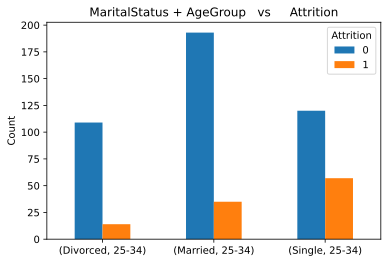

In [49]:
#Since we know employees in age group 25-34 have a attrition rate, Let us analyse the marital status of those employees
df_ff = df[(df['ageGroup'] == '25-34')] #filtered df
byGender_and_MaritalStatus = df_ff.groupby(['MaritalStatus','ageGroup']).Attrition.value_counts()
z= byGender_and_MaritalStatus.unstack()
z.plot.bar()
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.xlabel('')
plt.title("MaritalStatus + AgeGroup   vs     Attrition")

*Insights:*<br/>
Employees with marital status as single, have contributed to more attrition in the age group 25-34.

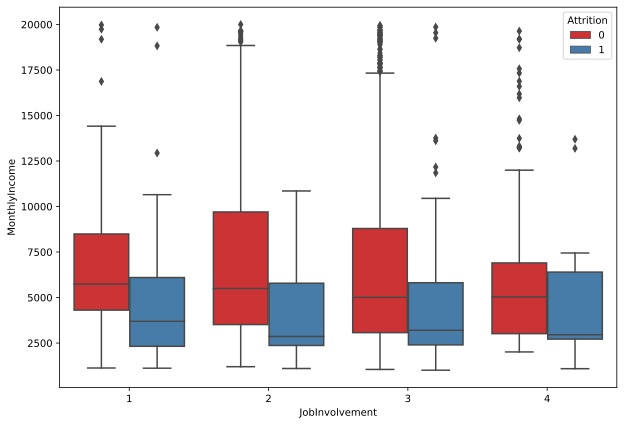

In [51]:
#Jobinvolvement and  Monthly income vs Attrition
plt.figure(figsize=(10,7))
sns.boxplot(x="JobInvolvement", y="MonthlyIncome", hue="Attrition",
            data=df, palette="Set1")

*Insights:*<br/>
Low income together with similar job involvement is the reason behind attrition

## Results and Inferences from EDA:

Probable factors affecting **Attrition**

* Age
* Monthly Income
* Over Time
* Total Working Years
* Years with Current Manager



### **Based on the analysis**
* Don't make them work overtime, they do care!

* Increase employee engagement, especially young employees

* Enhance recognition and rewards programs - Stock option can be a good choice 

* Create a pleasant workspace and increase satisfaction
